In [198]:
# The standard stuff
import pandas as pd
import numpy as np
# import math

# The world's most amazing NLP library.  Thank you Matthew Honnibal.  Remind me to give you a hug when I see you.
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from string import punctuation

# Your classic clustering 
# from sklearn import preprocessing
# from sklearn.cluster import KMeans
from sklearn import metrics

# Ooooooooh - now THIS should be fun.
import umap.umap_ as umap
import hdbscan

# And make it look pretty!
import matplotlib.pyplot as plt
# import matplotlib.ticker as plticker
import seaborn as sns
from tqdm import tqdm
# from tqdm.notebook import tqdm

In [2]:
# Load SpaCy's large embedding model
nlp = spacy.load('en_core_web_lg')

In [3]:
BASE_DIR = "E:/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"

In [4]:
df = pd.read_csv(INPUT_DIR + 'online-job-postings.csv')
print(df.columns.values)

['jobpost' 'date' 'Title' 'Company' 'AnnouncementCode' 'Term'
 'Eligibility' 'Audience' 'StartDate' 'Duration' 'Location'
 'JobDescription' 'JobRequirment' 'RequiredQual' 'Salary' 'ApplicationP'
 'OpeningDate' 'Deadline' 'Notes' 'AboutC' 'Attach' 'Year' 'Month' 'IT']


In [5]:
df = df.dropna(subset=['Title', 'JobDescription', 'Year', 'jobpost'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15090 entries, 0 to 19000
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   jobpost           15090 non-null  object
 1   date              15090 non-null  object
 2   Title             15090 non-null  object
 3   Company           15090 non-null  object
 4   AnnouncementCode  970 non-null    object
 5   Term              6695 non-null   object
 6   Eligibility       3614 non-null   object
 7   Audience          459 non-null    object
 8   StartDate         7932 non-null   object
 9   Duration          9050 non-null   object
 10  Location          15078 non-null  object
 11  JobDescription    15090 non-null  object
 12  JobRequirment     13128 non-null  object
 13  RequiredQual      15081 non-null  object
 14  Salary            8103 non-null   object
 15  ApplicationP      15090 non-null  object
 16  OpeningDate       14608 non-null  object
 17  Deadline    

In [7]:
def cleanTitles(sentence):
    newsent = ''.join(c for c in sentence if c not in punctuation)
    return ' '.join([x for x in newsent.split() if x.lower() not in STOP_WORDS])


df['cleanTitle'] = df.apply(lambda row: cleanTitles(row['Title']), axis=1)

In [8]:
df['cleanTitle'].head()

0               Chief Financial Officer
2                   Country Coordinator
3                        BCC Specialist
5                            Saleswoman
6    Chief Accountant Finance Assistant
Name: cleanTitle, dtype: object

In [9]:
def removeStopWords(description):
    return ' '.join([x for x in description.split() if x.lower() not in STOP_WORDS])


df['cleandesc'] = df.apply(lambda row: removeStopWords(row['JobDescription']), axis=1)

In [10]:
df['cleandesc'][0]

"AMERIA Investment Consulting Company seeking Chief Financial Officer. position manages company's fiscal administrative functions, provides highly responsible technically complex staff assistance Executive Director. work performed requires high level technical proficiency financial management investment management, management, supervisory, administrative skills."

In [11]:
alldescs = " ".join(df["cleandesc"].values)
alldescs = " ".join(alldescs.split())

wordcount = {}

for i in alldescs.lower().split():
    if i in wordcount:
        wordcount[i] += 1
    else:
        wordcount[i] = 1

sorted_wordcount = sorted(wordcount.items(), key=lambda x: x[1], reverse=True)

In [12]:
sorted_wordcount[0:25]

[('responsible', 4711),
 ('looking', 4290),
 ('incumbent', 3840),
 ('position', 3717),
 ('development', 3538),
 ('seeking', 3015),
 ('project', 2809),
 ('work', 2793),
 ('software', 2136),
 ('support', 2044),
 ('armenia', 1814),
 ('team', 1811),
 ('manager', 1713),
 ('management', 1712),
 ('-', 1712),
 ('candidate', 1681),
 ('llc', 1645),
 ('implementation', 1491),
 ('activities', 1454),
 ('company', 1424),
 ('financial', 1380),
 ('provide', 1322),
 ('technical', 1303),
 ('supervision', 1301),
 ('business', 1288)]

In [13]:
custom_stopwords = [
    'responsible', 
    'looking', 
    'incumbent',
    'position',
    'seeking',
    'work',
    'support',
    'team',
    'candidate',
    'llc',
    'company',
    'activities',
    'ensure', 
    'armenian', 
    'candidates', 
    '-', 
    'armenia']


def removeCustomStopWords(description):
    return ' '.join([x for x in description.split() if x.lower() not in custom_stopwords])


df['newcleandesc'] = df.apply(lambda row: removeCustomStopWords(row['cleandesc']), axis=1)
df = df.reset_index(drop=True)

In [15]:
df["cleanjob"] = df.apply(lambda row: removeStopWords(row["jobpost"]), axis=1)

In [16]:
# df['cleanjob'][0]

In [17]:
alldescs = " ".join(df["cleanjob"].values)
alldescs = " ".join(alldescs.split())

wordcount = {}

for i in alldescs.lower().split():
    if i in wordcount:
        wordcount[i] += 1
    else:
        wordcount[i] = 1

sorted_wordcount = sorted(wordcount.items(), key=lambda x: x[1], reverse=True)

In [18]:
sorted_wordcount[0:25]

[('-', 248529),
 ('job', 60175),
 ('application', 50865),
 ('mention', 32883),
 ('website', 30856),
 ('knowledge', 30648),
 ('experience', 27766),
 ('work', 25779),
 ('armenia', 25149),
 ('ability', 19545),
 ('letter', 18778),
 ('development', 18023),
 ('required', 17833),
 ('center', 17311),
 ('clearly', 16437),
 ('career', 16356),
 ('follow', 16308),
 ('opportunities', 16189),
 ('candidates', 15972),
 ('opportunity', 15879),
 ('available', 15772),
 ('place', 15431),
 ('free', 15410),
 ('qualifications:', 15371),
 ('yerevan,', 15272)]

In [19]:
custom_stopwords = [
    "-",
    "job",
    "application",
    "website",
    "ability",
    "responsible",
    "looking",
    "incumbent",
    "position",
    "seeking",
    "work",
    "support",
    "team",
    "candidate",
    "llc",
    "company",
    "activities",
    "ensure",
    "armenian",
    "candidates",
    "-",
    "armenia",
]

df["newcleanjob"] = df.apply(lambda row: removeCustomStopWords(row["cleanjob"]), axis=1)
df = df.reset_index(drop=True)

In [20]:
vectorsTitles = []
vectorsDescriptions = []
vectorsJobPosts = []
# counter = 0

for index, row in tqdm(df.iterrows()):
    # for token in nlp(row['cleanTitle']):
    # print(token.text, token.has_vector, token.vector_norm, token.is_oov)
    vectorsTitles.append(nlp(row["cleanTitle"]).vector)
    vectorsDescriptions.append(nlp(row["newcleandesc"]).vector)
    vectorsJobPosts.append(nlp(row["newcleanjob"]).vector)

    # show progress every 1000 - maybe go grab some coffee.
    # counter = counter + 1
    # if counter % 1000 == 0:
    #     print(counter)

15090it [16:31, 15.22it/s]


In [21]:
len(vectorsTitles), len(vectorsDescriptions), len(vectorsJobPosts)

(15090, 15090, 15090)

In [22]:
len(vectorsTitles[0]), len(vectorsDescriptions[0]), len(vectorsJobPosts[0])

(300, 300, 300)

In [174]:
# Concatenate arrays
# newVectors = np.concatenate(
#     [vectorsTitles, vectorsDescriptions, vectorsJobPosts], axis=1
# )
newVectors = np.asarray(vectorsTitles)
np.shape(newVectors)

(15090, 300)

In [176]:
# Ideal parameters I've found.  These are the values to experiment with.
# n_neighbors=10
n_range = [3, 5, 7, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80, 90, 100]
print(len(n_range))
min_cluster_size_list = [5, 10, 15, 25, 50, 75, 100, 150, 200, 250, 300]
print(len(min_cluster_size_list))

15
11


In [177]:
SEED = 6886
embeddings_list = []
tuning_result = {
    "n_neighbors": [],
    "min_cluster_size": [],
    "n_clusters": [],
    "n_noises": [],
    "silhouette": [],
}
model_list = []
labels_list = []

#     plt.figure(figsize=(12, 8))
#     plt.scatter(embeddings[:, 0], embeddings[:, 1], s=2, cmap="rainbow")
#     plt.title("n_neighbors = " + str(n))
#     plt.axis("off")
#     plt.tight_layout()

In [ ]:
tqdm_bar = tqdm(desc="Fitting HDBSCAN", total=len(n_range) * len(min_cluster_size_list))
for idn, n in enumerate(n_range):

    reducer = umap.UMAP(n_neighbors=n, random_state=SEED, verbose=False)
    embeddings = reducer.fit_transform(newVectors)

    for min_cluster_size in min_cluster_size_list:
        model = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size, core_dist_n_jobs=8
        ).fit(embeddings)
        labels = model.labels_
        n_clusters = len(set(labels) - set([-1]))
        n_noises = len(np.where(labels == -1)[0])

        embeddings_list.append(embeddings)
        model_list.append(model)
        labels_list.append(labels)

        tuning_result["n_neighbors"].append(n)
        tuning_result["min_cluster_size"].append(min_cluster_size)
        tuning_result["n_clusters"].append(n_clusters)
        tuning_result["n_noises"].append(n_noises)
        print(n, min_cluster_size, n_clusters, n_noises)
        tqdm_bar.update(1)
tqdm_bar.close()

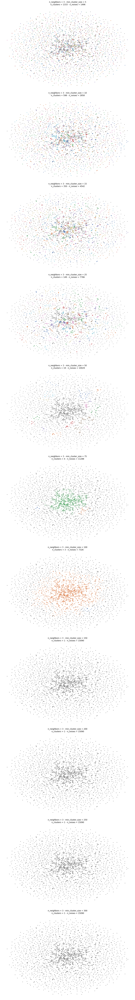

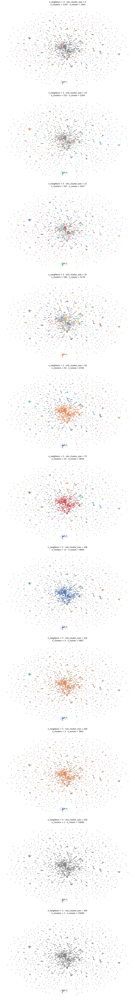

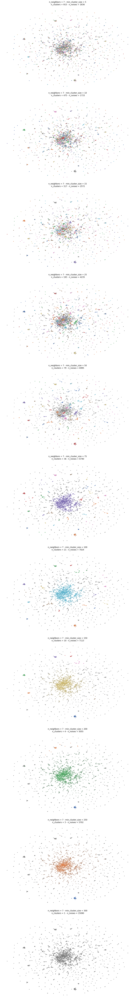

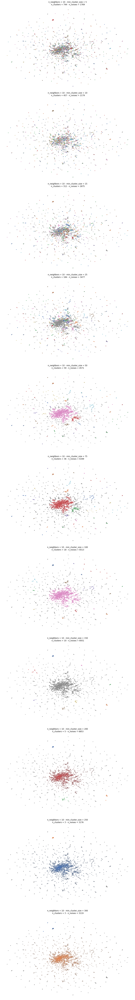

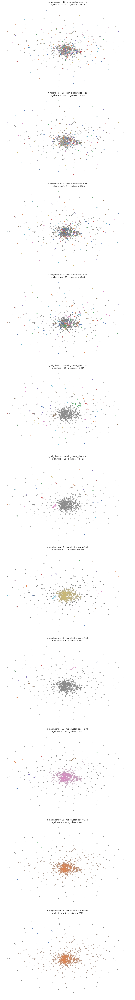

...

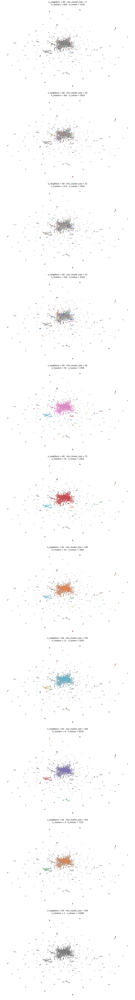

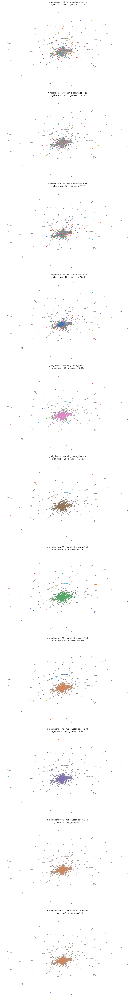

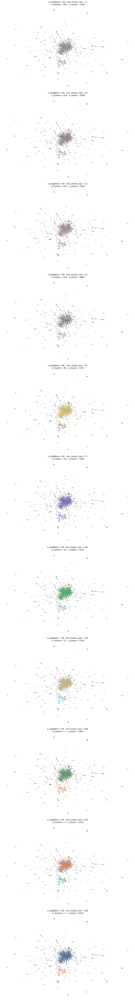

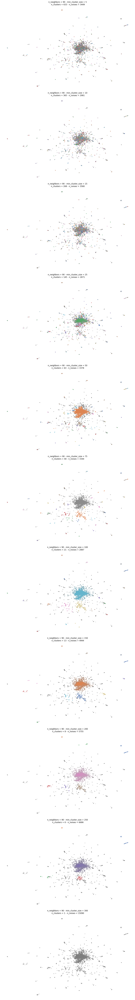

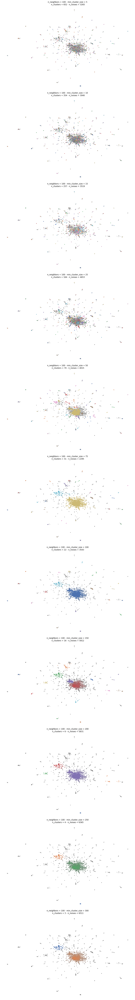

In [182]:
for idn, n_neighbors in enumerate(n_range):
    indices = np.where(np.array(tuning_result["n_neighbors"]) == n_neighbors)[0]
    plt.figure(figsize=(12, 8 * len(indices)))
    for i, idx in enumerate(indices):
        ax = plt.subplot(len(indices), 1, i + 1)
        pal = sns.color_palette("deep", tuning_result["n_clusters"][idx])
        colors = [
            sns.desaturate(pal[col], sat)
            for col, sat in zip(labels_list[idx], model_list[idx].probabilities_)
        ]
        ax.scatter(
            embeddings_list[idx][:, 0], embeddings_list[idx][:, 1], c=colors, s=2
        )
        ax.set_title(
            "n_neighbors = "
            + str(n_neighbors)
            + " - min_cluster_size = "
            + str(tuning_result["min_cluster_size"][idx])
            + "\n n_clusters = "
            + str(tuning_result["n_clusters"][idx])
            + " - n_noises = "
            + str(tuning_result["n_noises"][idx])
        )
        ax.set_axis_off()
    plt.tight_layout()

In [ ]:
tuning_result["silhouette"] = []
tuning_result["silhouette_error"] = []

tqdm_bar = tqdm(desc="Computing Silhouette score", total=len(model_list))
for i, idx in enumerate(model_list):
    try:
        silhouette = metrics.silhouette_score(
            embeddings_list[i],
            labels_list[i],
            sample_size=5000,
            random_state=SEED, n_jobs=-1
        )
        tuning_result["silhouette_error"].append('None')
    except Exception as e:
        print(e)
        silhouette = -1.1
        tuning_result["silhouette_error"].append(e)
    tuning_result["silhouette"].append(silhouette)
    tqdm_bar.update(1)
tqdm_bar.close()

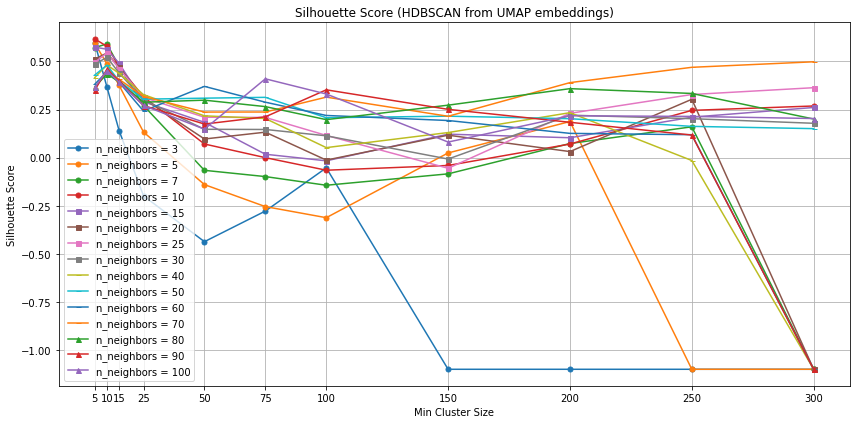

In [197]:
plt.figure(figsize=(12, 6))
for idn, n_neighbors in enumerate(n_range):
    indices = np.where(np.array(tuning_result["n_neighbors"]) == n_neighbors)[0]
#     print(indices)
#     print(np.asarray(tuning_result["min_cluster_size"])[indices])
#     print(np.asarray(tuning_result["silhouette"])[indices])
    if n_neighbors <= 10:
        marker = 'o'
    elif n_neighbors > 10 and n_neighbors <= 30:
        marker = 's'
    elif n_neighbors > 30 and n_neighbors <= 70:
        marker = '_'
    else:
        marker = '^'
    plt.plot(
        np.asarray(tuning_result["min_cluster_size"])[indices],
        np.asarray(tuning_result["silhouette"])[indices],
        marker=marker, markersize=5,
        label="n_neighbors = " + str(n_neighbors),
    )
    plt.title(
        "Silhouette Score (HDBSCAN from UMAP embeddings)"
    )
#     plt.axis("off")
plt.legend(loc="best")
plt.xlabel('Min Cluster Size')
plt.xticks(np.unique(tuning_result['min_cluster_size']))
plt.ylabel('Silhouette Score')
plt.grid()
plt.tight_layout()

In [195]:
tuning_result_df = pd.DataFrame(tuning_result)
tuning_result_df

,n_neighbors,min_cluster_size,n_clusters,n_noises,silhouette,silhouette_error
0,3,5,1333,1496,0.596702,None
1,3,10,598,2858,0.366719,None
2,3,15,350,4542,0.140038,None
3,3,25,149,7786,-0.198451,None
4,3,50,19,10029,-0.436733,None
...,...,...,...,...,...,...
160,100,100,22,3543,0.330801,None
161,100,150,16,5812,0.081011,None
162,100,200,6,5831,0.217651,None
163,100,250,4,6365,0.214288,None


In [ ]:
tuning_result["calinski_harabasz"] = []
tuning_result["calinski_harabasz_error"] = []

tqdm_bar = tqdm(desc="Computing Calinski Harabasz score", total=len(model_list))
for i, idx in enumerate(model_list):
    try:
        calinski_harabasz = metrics.calinski_harabasz_score(
            embeddings_list[i], labels_list[i]
        )
        tuning_result["calinski_harabasz_error"].append("None")
    except Exception as e:
        print(e)
        calinski_harabasz = -1.1
        tuning_result["calinski_harabasz_error"].append(e)
    tuning_result["calinski_harabasz"].append(calinski_harabasz)
    tqdm_bar.update(1)
tqdm_bar.close()

In [ ]:
tuning_result_df = pd.DataFrame(tuning_result)
tuning_result_df

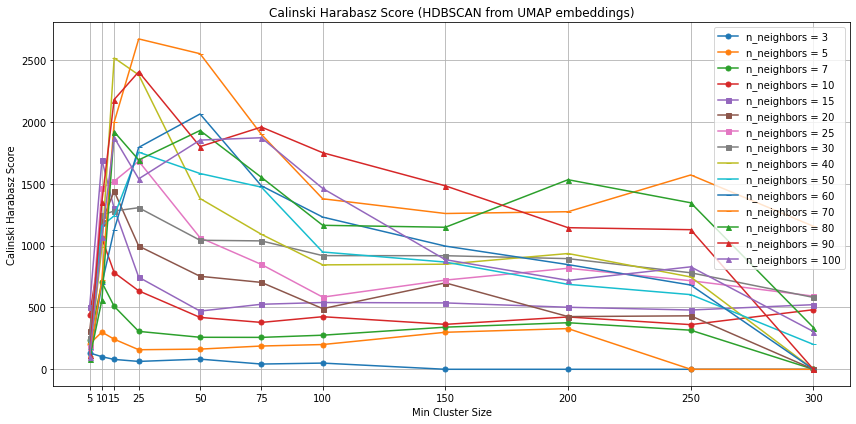

In [210]:
plt.figure(figsize=(12, 6))
for idn, n_neighbors in enumerate(n_range):
    indices = np.where(np.array(tuning_result["n_neighbors"]) == n_neighbors)[0]
#     print(indices)
#     print(np.asarray(tuning_result["min_cluster_size"])[indices])
#     print(np.asarray(tuning_result["silhouette"])[indices])
    if n_neighbors <= 10:
        marker = 'o'
    elif n_neighbors > 10 and n_neighbors <= 30:
        marker = 's'
    elif n_neighbors > 30 and n_neighbors <= 70:
        marker = '_'
    else:
        marker = '^'
    plt.plot(
        np.asarray(tuning_result["min_cluster_size"])[indices],
        np.asarray(tuning_result["calinski_harabasz"])[indices],
        marker=marker, markersize=5,
        label="n_neighbors = " + str(n_neighbors),
    )
    plt.title(
        "Calinski Harabasz Score (HDBSCAN from UMAP embeddings)"
    )
#     plt.axis("off")
plt.legend(loc="best")
plt.xlabel('Min Cluster Size')
plt.xticks(np.unique(tuning_result['min_cluster_size']))
plt.ylabel('Calinski Harabasz Score')
plt.grid()
plt.tight_layout()

In [ ]:
tuning_result["davies_bouldin"] = []
tuning_result["davies_bouldin_error"] = []

tqdm_bar = tqdm(desc="Computing Davies Bouldin score", total=len(model_list))
for i, idx in enumerate(model_list):
    try:
        davies_bouldin = metrics.davies_bouldin_score(embeddings_list[i], labels_list[i])
        tuning_result["davies_bouldin_error"].append("None")
    except Exception as e:
        print(e)
        davies_bouldin = -1.1
        tuning_result["davies_bouldin_error"].append(e)
    tuning_result["davies_bouldin"].append(davies_bouldin)
    tqdm_bar.update(1)
tqdm_bar.close()

In [212]:
tuning_result_df = pd.DataFrame(tuning_result)
tuning_result_df

,n_neighbors,min_cluster_size,n_clusters,n_noises,silhouette,silhouette_error,calinski_harabasz,calinski_harabasz_error,davies_bouldin,davies_bouldin_error
0,3,5,1333,1496,0.596702,None,131.216515,None,1.241653,None
1,3,10,598,2858,0.366719,None,100.424359,None,1.571781,None
2,3,15,350,4542,0.140038,None,78.753466,None,1.953115,None
3,3,25,149,7786,-0.198451,None,62.476627,None,1.872227,None
4,3,50,19,10029,-0.436733,None,80.940760,None,3.886278,None
...,...,...,...,...,...,...,...,...,...,...
160,100,100,22,3543,0.330801,None,1461.756485,None,0.997326,None
161,100,150,16,5812,0.081011,None,885.435052,None,1.715172,None
162,100,200,6,5831,0.217651,None,718.062071,None,2.349396,None
163,100,250,4,6365,0.214288,None,827.623667,None,3.148418,None


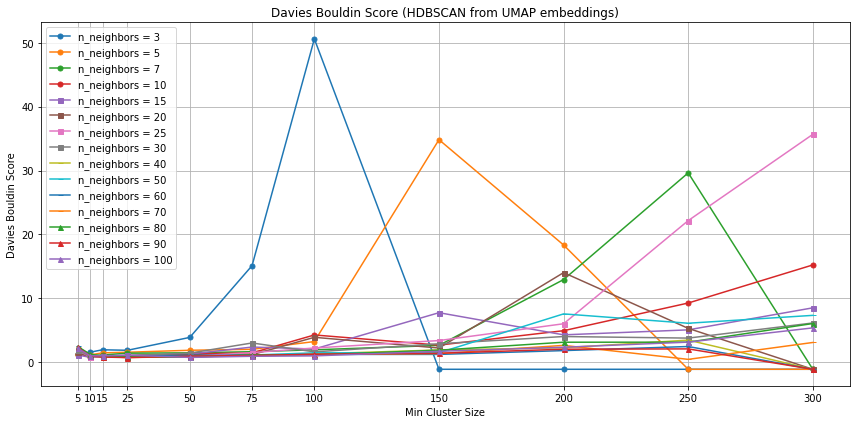

In [213]:
plt.figure(figsize=(12, 6))
for idn, n_neighbors in enumerate(n_range):
    indices = np.where(np.array(tuning_result["n_neighbors"]) == n_neighbors)[0]
#     print(indices)
#     print(np.asarray(tuning_result["min_cluster_size"])[indices])
#     print(np.asarray(tuning_result["silhouette"])[indices])
    if n_neighbors <= 10:
        marker = 'o'
    elif n_neighbors > 10 and n_neighbors <= 30:
        marker = 's'
    elif n_neighbors > 30 and n_neighbors <= 70:
        marker = '_'
    else:
        marker = '^'
    plt.plot(
        np.asarray(tuning_result["min_cluster_size"])[indices],
        np.asarray(tuning_result["davies_bouldin"])[indices],
        marker=marker, markersize=5,
        label="n_neighbors = " + str(n_neighbors),
    )
    plt.title(
        "Davies Bouldin Score (HDBSCAN from UMAP embeddings)"
    )
#     plt.axis("off")
plt.legend(loc="best")
plt.xlabel('Min Cluster Size')
plt.xticks(np.unique(tuning_result['min_cluster_size']))
plt.ylabel('Davies Bouldin Score')
plt.grid()
plt.tight_layout()

In [250]:
best_index = tuning_result_df.loc[
    (tuning_result_df["n_neighbors"] == 3)
    & (tuning_result_df["min_cluster_size"] == 100)
].index[0]
best_index

6

In [252]:
hddf = df
hddf['cluster'] = labels_list[best_index]
hddf[hddf['cluster'] == 0]['cleanTitle'], hddf[hddf['cluster'] == 5]['cleanTitle']

(100             Sales Marketing Specialist
 138                     Translator general
 194             Sales Marketing Specialist
 355      Administrative Program Volunteers
 576        Finance Administration Director
                        ...                
 14670                       Office Manager
 14714                           HR Manager
 15006                       Office Manager
 15022               Medical Representative
 15029            Office Manager Translator
 Name: cleanTitle, Length: 107, dtype: object,
 Series([], Name: cleanTitle, dtype: object))

In [253]:
wordcount = {}
sorted_wordcount = {}
for i in range(max(hddf['cluster'].unique()) + 1):
    titles = hddf[hddf['cluster'] == i]["cleanTitle"].values
    titles = ' '.join(' '.join(titles).split())
    wordcount[i] = {}
    for j in titles.lower().split():
        if j in wordcount[i]: 
            wordcount[i][j] += 1
        else:
            wordcount[i][j] = 1
    sorted_wordcount[i] = sorted(wordcount[i].items(), key=lambda x: x[1], reverse=True)
    # print("Cluster: " + str(i))
    # print(sorted_wordcount[i][0:5])
    # print('---')

In [254]:
topwords = {}
for key, i in sorted_wordcount.items():
    print("Cluster "+str(key)+": ", end='')
    topwords[key] = ''
    for newkey, j in sorted_wordcount[key][:8]:
        print(newkey + ' / ', end='')
        topwords[key] = topwords[key] + newkey + ' / '
    print()

Cluster 0: manager / office / representative / sales / marketing / medical / specialist / software / 
Cluster 1: specialist / manager / developer / senior / assistant / engineer / department / software / 


In [257]:
best_n_clusters = tuning_result["n_clusters"][best_index]-1
best_min_cluster_size = tuning_result["min_cluster_size"][best_index]
best_n_neighbors = tuning_result["n_neighbors"][best_index]
best_n_noises = tuning_result["n_noises"][best_index]
best_embbedings = np.asarray(embeddings_list)[
    np.where(np.array(n_range) == best_n_neighbors)[0]
][0]

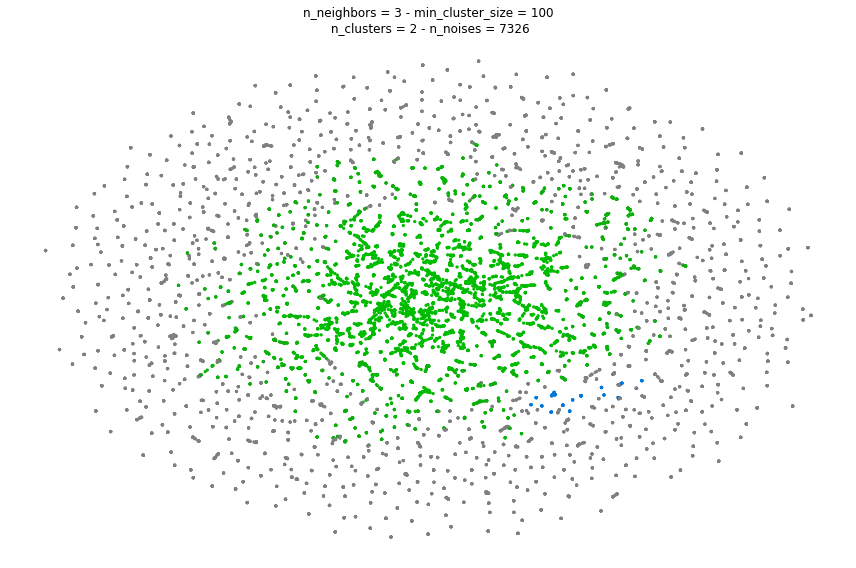

In [258]:
plt.figure(figsize=(12, 8))
pal = sns.color_palette("nipy_spectral", best_n_clusters+1)
colors = [
    sns.desaturate(pal[col], sat)
    for col, sat in zip(labels_list[best_index], model_list[best_index].probabilities_)
]
plt.scatter(
    best_embbedings[:, 0], best_embbedings[:, 1], c=colors, s=5
)
plt.title(
    "n_neighbors = "
    + str(best_n_neighbors)
    + " - min_cluster_size = "
    + str(best_min_cluster_size)
    + "\n n_clusters = "
    + str(best_n_clusters)
    + " - n_noises = "
    + str(best_n_noises)
)
plt.axis('off')
plt.tight_layout()

In [259]:
# Libraries to visualize data
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from cluster_visualization_helper import (
    visualize_cluster)  # user-defined functions

Start PCA 2021-05-10 20:34:50.774816
End PCA 2021-05-10 20:34:50.789814
PCA duration 0:00:00.014998



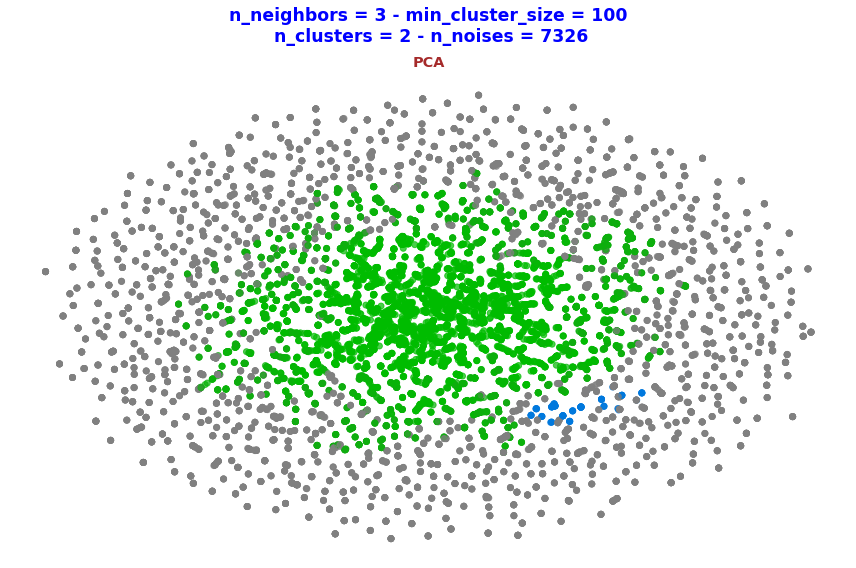

In [260]:
plot_title = (
    "n_neighbors = "
    + str(best_n_neighbors)
    + " - min_cluster_size = "
    + str(best_min_cluster_size)
    + "\n n_clusters = "
    + str(best_n_clusters)
    + " - n_noises = "
    + str(best_n_noises)
)
palette = sns.color_palette("nipy_spectral", best_n_clusters+1)
# colors = cm.nipy_spectral(best_labels.astype(float) / best_k)
colors = [
    sns.desaturate(pal[col], sat)
    for col, sat in zip(labels_list[best_index], model_list[best_index].probabilities_)
]

# Visualize clusters with PCA and t-SNE
visualize_cluster(
    plot_title,
    (12, 8),
    colors,
    palette,
    best_embbedings,
    None,
    None,
    pca=True,
    tsne=False,
    mds=False,
)

In [268]:
tokens = nlp('I am seeking a data analyst')
for token in tokens:
    print(token.text, token.is_oov, token.vector_norm, token.has_vector)

I False 6.4231944 True
am False 6.8401594 True
seeking False 6.0025573 True
a False 5.306696 True
data False 7.1505103 True
analyst False 7.489983 True


In [269]:
list(tokens.noun_chunks)

[I, a data analyst]

In [1]:
BASE_DIR = "E:/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"

In [21]:
import numpy as np
X_raw = np.load(OUTPUT_DIR + 'title_embeddings.npy')
X_raw.shape

(18992, 300)

In [131]:
import pandas as pd 

np.random.seed = 6886
n_features = 3
X = X_raw[:4, :n_features]
X_synthetic = pd.DataFrame(X).apply(np.random.permutation, axis=0)
X.shape, X_synthetic.shape

((4, 3), (4, 3))

In [132]:
X_total = np.concatenate((X, np.asarray(X_synthetic)))
Y_total = np.vstack((np.ones((X.shape[0],1)), np.zeros((X.shape[0],1))))
X_total.shape, Y_total.shape

((8, 3), (8, 1))

In [133]:
from sklearn.tree import DecisionTreeClassifier 

fullClassTree = DecisionTreeClassifier(random_state=6886) 
fullClassTree.fit(X_total, Y_total)

DecisionTreeClassifier(random_state=6886)

In [134]:
import os 
os.environ["PATH"] += os.pathsep + r'C:\Program Files\Graphviz\bin'

In [135]:
col_names = ['feature_' + str(i) for i in range(1, n_features+1)]
col_names

['feature_1', 'feature_2', 'feature_3']

In [136]:
fullClassTree.classes_

array([0., 1.])

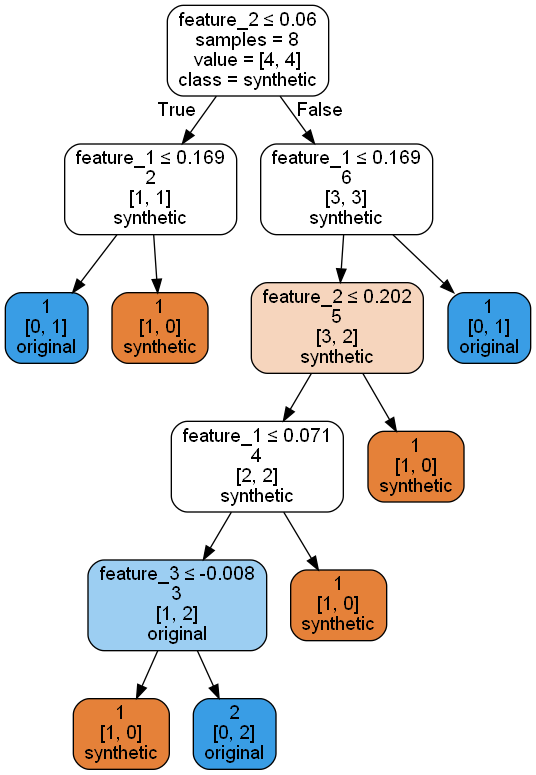

In [137]:
from dmba import plotDecisionTree 
import pydotplus
plotDecisionTree(fullClassTree, feature_names=col_names, class_names=['synthetic', 'original'])

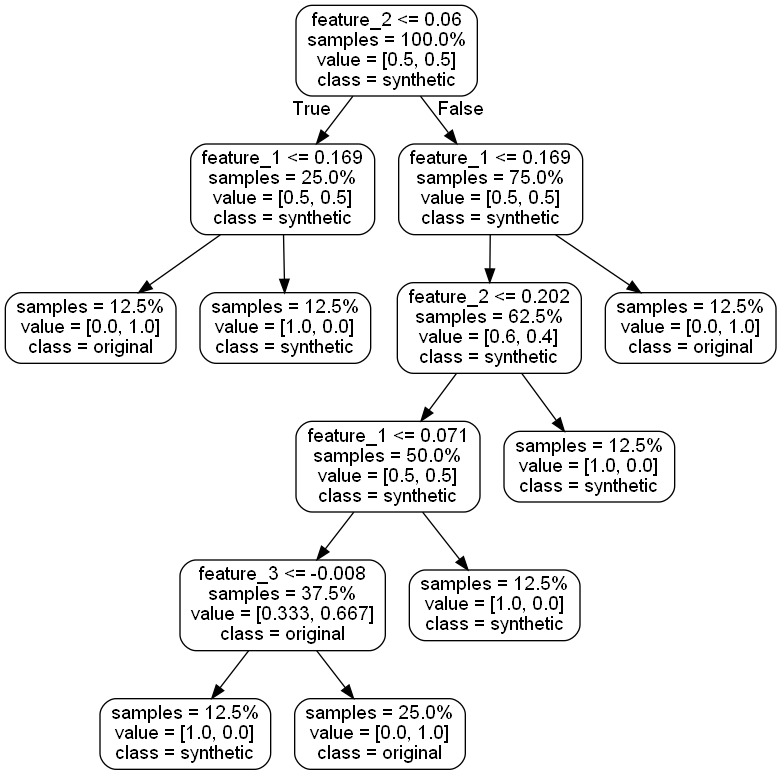

In [138]:
# generate the graphical representation using the sklearn library 
from sklearn import tree 
from IPython.display import Image
dot_data = tree.export_graphviz(fullClassTree, out_file=None, impurity=None,
                   feature_names=col_names, class_names=['synthetic', 'original'], label='all',
                   filled=False, max_depth=10, proportion=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data) 
graph.write_png(OUTPUT_DIR + "example2_decision_tree.png")
Image(graph.create_png())

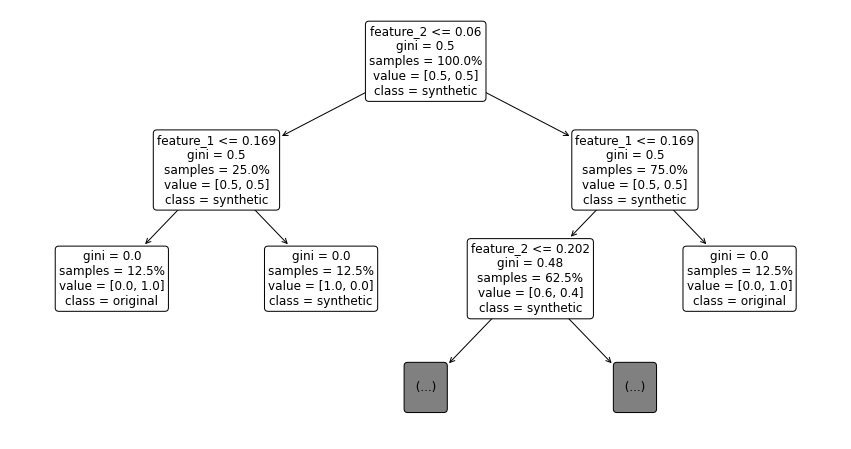

In [139]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(15,8))
_ = tree.plot_tree(fullClassTree, 
                   feature_names=col_names, class_names=['synthetic', 'original'], label='all',
                   filled=False, max_depth=2, proportion=True, rounded=True, fontsize=12)
fig.savefig(OUTPUT_DIR + "example_decision_tree.png")                   